# Stock Price Prediction and Sentiment Analysis
Description
This project is an advanced tool for predicting stock prices and analyzing market sentiment based on historical data and news headlines. It combines data fetching, feature engineering, machine learning, and sentiment analysis into a cohesive pipeline to provide actionable insights for investors and data enthusiasts.

# Features
Data Fetching: Downloads historical stock data using Yahoo Finance API.

Feature Engineering: Computes moving averages, volatility, RSI, and other technical indicators.

Machine Learning Models: Supports Linear Regression and Random Forest for stock price prediction.

Sentiment Analysis: Scrapes Google News headlines to analyze market sentiment for each stock.

Visualizations: Generates interactive and static plots:

    Price trends

    Candlestick charts

    Correlation matrices

    Rolling statistics

    Predicted vs actual stock prices

    Database Support: Stores stock data in a SQLite database for scalability.

# Functions Overview
Initialization

__init__: Initializes the class with stock symbols, start and end dates, and containers for stock data and sentiments.

Data Handling

fetch_data: Fetches stock data from Yahoo Finance and ensures the data index is datetime-compatible.

save_to_database: Saves fetched data into a SQLite database for scalability.

feature_engineering: Adds computed columns such as moving averages, RSI, volatility, and ROC for feature enhancement.

Sentiment Analysis

perform_sentiment_analysis: Performs parallel sentiment analysis for all stocks using Google News headlines.

_analyze_sentiment_for_symbol: Handles sentiment analysis for individual stocks.

Machine Learning

preprocess_data: Prepares feature and target datasets for machine learning.

scale_data: Scales training and testing data using StandardScaler for normalization.

train_model: Trains either a Linear Regression or Random Forest model based on user selection.

evaluate_model: Evaluates the trained model using MSE, MAE, and R^2.

Visualization

plot_price_trends: Plots the closing price trend for a stock.

plot_candlestick_chart: Creates an interactive candlestick chart for the stock.

plot_correlation_matrix: Visualizes the correlation matrix of stock features.

plot_rolling_stats: Shows rolling mean and standard deviation of stock prices.

plot_distribution: Displays the distribution of stock prices using histograms.

plot_predicted_vs_actual: Compares predicted vs actual stock prices in a line chart.

Summary and Execution

generate_stock_summary: Generates a textual summary of the stock, including trend and sentiment.

run: Executes the entire pipeline for fetching, analyzing, and visualizing stock data.


# Prerequisites
Ensure you have Python 3.8+ installed. Install the following libraries:

Data Handling: pandas, numpy
Machine Learning: scikit-learn
Visualization: matplotlib, seaborn, plotly
Web Scraping: requests, beautifulsoup4
Database: sqlalchemy
Other: yfinance, tqdm, textblob
Install these packages using:


pip install pandas numpy scikit-learn matplotlib seaborn plotly requests beautifulsoup4 sqlalchemy yfinance tqdm textblob


# Output Samples
--- Stock Summary for AAPL ---

Date Range: 2014-12-02 to 2024-12-02

Latest Data (as of 2024-12-01):

  Open Price: 175.23 USD
  
  Close Price: 180.45 USD
  
  High Price: 182.50 USD
  
  Low Price: 174.80 USD
  
  Volume: 34,567,890
  
  Trend: Stock is increasing.
  
  Sentiment: Positive (Score: 0.35)


# Project Structure

stock-prediction/

│

├── stock_prediction.py    # Main script for fetching, analyzing, and visualizing stocks

├── README.md              # Project documentation

├── stock_prediction.log   # Log file for debugging

└── assets/                # Folder for storing example outputs


# Future Enhancements

Add a dashboard using Streamlit or Dash for real-time interaction.

Integrate other ML models like Gradient Boosting or LSTMs.

Add alerts for significant sentiment changes or price fluctuations.

# Contributors
Gyanoba (Owner & Developer)

In [1]:
# Import required libraries
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from datetime import datetime, timedelta
from tqdm import tqdm
import plotly.graph_objects as go
from textblob import TextBlob
import requests
from bs4 import BeautifulSoup
import logging
from concurrent.futures import ThreadPoolExecutor
from sqlalchemy import create_engine

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
# Configure logging
logging.basicConfig(filename='stock_prediction.log', level=logging.ERROR,
                    format='%(asctime)s - %(levelname)s - %(message)s')

In [3]:
# Define the StockPrediction Class
class StockPrediction:
    def __init__(self, stock_symbols, start_date, end_date=None):
        self.stock_symbols = stock_symbols
        self.start_date = start_date
        self.end_date = end_date or datetime.today().strftime('%Y-%m-%d')
        self.stock_data = {}
        self.sentiments = {}

    def fetch_data(self):
        print("Fetching data for multiple stocks...")
        for symbol in tqdm(self.stock_symbols, desc="Stocks"):
            try:
                data = yf.download(symbol, start=self.start_date, end=self.end_date)
                if not data.empty:
                    data.index = pd.to_datetime(data.index)  # Ensure index is datetime
                    self.stock_data[symbol] = data
                    self.save_to_database(symbol, data)  # Save to database
                    self.feature_engineering(symbol)
                else:
                    print(f"No data found for {symbol}. Skipping.")
            except Exception as e:
                logging.error(f"Error fetching data for {symbol}: {e}")
                print(f"Error fetching data for {symbol}. Check logs for details.")

    def save_to_database(self, symbol, data):
        try:
            engine = create_engine('sqlite:///stocks.db')
            data.to_sql(symbol, engine, if_exists='replace', index=False)
        except Exception as e:
            logging.error(f"Error saving data for {symbol} to database: {e}")

    def feature_engineering(self, symbol):
        data = self.stock_data[symbol]

        if len(data) < 30:
            print(f"Insufficient data for {symbol}. Skipping feature engineering.")
            self.stock_data[symbol] = pd.DataFrame()
            return

        data['MA5'] = data['Close'].rolling(window=5).mean()
        data['MA10'] = data['Close'].rolling(window=10).mean()
        data['MA20'] = data['Close'].rolling(window=20).mean()
        data['Volatility'] = data['Close'].rolling(window=20).std()

        delta = data['Close'].diff()
        gain = delta.where(delta > 0, 0)
        loss = -delta.where(delta < 0, 0)
        avg_gain = gain.rolling(window=14).mean()
        avg_loss = loss.rolling(window=14).mean()
        rs = avg_gain / avg_loss
        data['RSI'] = 100 - (100 / (1 + rs))

        data['ROC'] = data['Close'].pct_change() * 100
        data['Lagged_Close'] = data['Close'].shift(1)

        self.stock_data[symbol] = data.dropna()

    def perform_sentiment_analysis(self):
        print("Performing sentiment analysis for all stocks...")
        with ThreadPoolExecutor(max_workers=5) as executor:
            executor.map(self._analyze_sentiment_for_symbol, self.stock_symbols)

    def _analyze_sentiment_for_symbol(self, symbol):
        try:
            url = f"https://www.google.com/search?q={symbol}+stock+news"
            headers = {'User-Agent': 'Mozilla/5.0'}
            response = requests.get(url, headers=headers)
            soup = BeautifulSoup(response.text, 'html.parser')
            news_headlines = [item.text for item in soup.find_all('h3') if item.text]

            sentiments = [TextBlob(headline).sentiment.polarity for headline in news_headlines]
            self.sentiments[symbol] = np.mean(sentiments) if sentiments else 0
        except Exception as e:
            logging.error(f"Error performing sentiment analysis for {symbol}: {e}")
            self.sentiments[symbol] = 0

    def preprocess_data(self, data):
        data['Next_Close'] = data['Close'].shift(-1)
        data = data.dropna()
        features = ['Open', 'High', 'Low', 'Close', 'Volume', 'MA5', 'MA10', 'MA20', 'Volatility', 'RSI', 'ROC', 'Lagged_Close']
        target = 'Next_Close'
        X = data[features]
        y = data[target]
        return X, y

    def scale_data(self, X_train, X_test):
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        return X_train_scaled, X_test_scaled

    def train_model(self, X_train, y_train, model_type='LinearRegression'):
        if model_type == 'LinearRegression':
            model = LinearRegression()
        elif model_type == 'RandomForest':
            model = RandomForestRegressor(n_estimators=100)
        model.fit(X_train, y_train)
        return model

    def evaluate_model(self, model, X_test, y_test):
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        return mse, mae, r2, y_pred

    def plot_price_trends(self, data, symbol):
        plt.figure(figsize=(10, 6))
        plt.plot(data['Close'], label='Close Price', color='blue')
        plt.title(f'{symbol} Stock Price Trend')
        plt.xlabel('Date')
        plt.ylabel('Price (USD)')
        plt.legend()
        plt.grid(True)
        plt.show()

    def plot_candlestick_chart(self, data, symbol):
        data.reset_index(inplace=True)
        dates = data['Date'].to_numpy()

        fig = go.Figure(data=[go.Candlestick(
            x=dates,
            open=data['Open'],
            high=data['High'],
            low=data['Low'],
            close=data['Close']
        )])
        fig.update_layout(
            title=f'{symbol} Stock Candlestick Chart',
            xaxis_title="Date",
            yaxis_title="Price (USD)",
            xaxis_rangeslider_visible=False
        )
        fig.show()

    def plot_correlation_matrix(self, data, symbol):
        plt.figure(figsize=(10, 6))
        corr_matrix = data[['Open', 'High', 'Low', 'Close', 'Volume']].corr()
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
        plt.title(f'{symbol} Stock Correlation Matrix')
        plt.show()

    def plot_rolling_stats(self, data, symbol):
        window = 20
        rolling_mean = data['Close'].rolling(window=window).mean()
        rolling_std = data['Close'].rolling(window=window).std()

        plt.figure(figsize=(10, 6))
        plt.plot(data['Close'], label='Close Price', color='blue')
        plt.plot(rolling_mean, label=f'{window}-Day Rolling Mean', color='red')
        plt.plot(rolling_std, label=f'{window}-Day Rolling Std Dev', color='green')
        plt.title(f'{symbol} Stock Price with Rolling Mean & Std Dev')
        plt.xlabel('Date')
        plt.ylabel('Price (USD)')
        plt.legend()
        plt.grid(True)
        plt.show()

    def plot_distribution(self, data, symbol):
        plt.figure(figsize=(10, 6))
        sns.histplot(data['Close'], kde=True, color='blue', bins=50)
        plt.title(f'{symbol} Stock Price Distribution')
        plt.xlabel('Price (USD)')
        plt.ylabel('Frequency')
        plt.show()

    def plot_predicted_vs_actual(self, y_test, y_pred, symbol):
        plt.figure(figsize=(10, 6))
        plt.plot(y_test.index, y_test, label='Actual', color='blue')
        plt.plot(y_test.index, y_pred, label='Predicted', color='red')
        plt.title(f'{symbol} Predicted vs Actual Stock Prices')
        plt.xlabel('Date')
        plt.ylabel('Price (USD)')
        plt.legend()
        plt.show()

    def generate_stock_summary(self, symbol):
        data = self.stock_data[symbol]
        if data.empty:
            return f"No data available for {symbol}. Skipping."

        latest_data = data.iloc[-1]

        # Ensure latest_date is a datetime object
        latest_date = data.index[-1]
        if not isinstance(latest_date, datetime):
            try:
                latest_date = pd.to_datetime(latest_date)
            except Exception as e:
                return f"Error converting {latest_date} to datetime for {symbol}: {e}"

        open_price = float(latest_data['Open'])
        close_price = float(latest_data['Close'])
        high_price = float(latest_data['High'])
        low_price = float(latest_data['Low'])
        volume = int(latest_data['Volume'])
        trend = "increasing" if close_price > open_price else "decreasing"
        sentiment_score = self.sentiments.get(symbol, 0)
        sentiment = "Positive" if sentiment_score > 0 else "Negative" if sentiment_score < 0 else "Neutral"

        summary = f"--- Stock Summary for {symbol.upper()} ---\n"
        summary += f"Date Range: {self.start_date} to {self.end_date}\n"
        summary += f"Latest Data (as of {latest_date.date()}):\n"
        summary += f"  Open Price: {open_price:.2f} USD\n"
        summary += f"  Close Price: {close_price:.2f} USD\n"
        summary += f"  High Price: {high_price:.2f} USD\n"
        summary += f"  Low Price: {low_price:.2f} USD\n"
        summary += f"  Volume: {volume:,}\n"
        summary += f"  Trend: Stock is {trend}.\n"
        summary += f"  Sentiment: {sentiment} (Score: {sentiment_score:.2f})\n"
        return summary
    
    def calculate_accuracy_percentage(self, r2_score):
        """Convert R² to accuracy percentage."""
        return max(0, min(100, r2_score * 100))

    

    def run(self, model_type='LinearRegression'):
        self.perform_sentiment_analysis()
        for symbol, data in self.stock_data.items():
            if data.empty:
                print(f"No data available for {symbol}. Skipping.")
                continue

            X, y = self.preprocess_data(data)
            if X.empty or y.empty:
                print(f"Not enough data for training for {symbol}. Skipping.")
                continue

            test_size = 0.2 if len(X) > 10 else 0.1
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, shuffle=False)
            X_train_scaled, X_test_scaled = self.scale_data(X_train, X_test)

            results = {}
            for m_type in ['LinearRegression', 'RandomForest']:
                model = self.train_model(X_train_scaled, y_train, m_type)
                mse, mae, r2, y_pred = self.evaluate_model(model, X_test_scaled, y_test)
                accuracy_percentage = self.calculate_accuracy_percentage(r2)
                results[m_type] = {'MSE': mse, 'MAE': mae, 'R²': r2, 'Accuracy (%)': accuracy_percentage}

            # Print Model Accuracy Comparison
            print(f"{symbol} Model Comparison: {results}")

            # Visualizations and Summary
            self.plot_price_trends(data, symbol)
            self.plot_candlestick_chart(data, symbol)
            self.plot_correlation_matrix(data, symbol)
            self.plot_rolling_stats(data, symbol)
            self.plot_distribution(data, symbol)
            self.plot_predicted_vs_actual(y_test, y_pred, symbol)
            print(self.generate_stock_summary(symbol))

In [4]:
# Define a list of stocks and the start date as 10 years ago
stock_symbols = ['AAPL', 'GOOG', 'AMZN', 'MSFT', 'TSLA', 'META', 'NVDA', 'BABA', 'INTC', 'AMD']
start_date = (datetime.today() - timedelta(days=365*10)).strftime('%Y-%m-%d')

In [5]:
# Create and initialize the StockPrediction object
prediction = StockPrediction(stock_symbols=stock_symbols, start_date=start_date)

In [6]:
# Fetch data for all stocks
prediction.fetch_data()

Fetching data for multiple stocks...


[*********************100%***********************]  1 of 1 completed                            | 0/10 [00:00<?, ?it/s]
C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:29: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  data.to_sql(symbol, engine, if_exists='replace', index=False)
[*********************100%***********************]  1 of 1 completed                    | 1/10 [00:02<00:20,  2.22s/it]
C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:29: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  data.to_sql(symbol, engine, if_exists='replace', index=False)
[*********************100%***********************]  1 of 1 completed        

Performing sentiment analysis for all stocks...
AAPL Model Comparison: {'LinearRegression': {'MSE': 6.789983403723401, 'MAE': 1.9238541516625236, 'R²': 0.9906727950355985, 'Accuracy (%)': 99.06727950355985}, 'RandomForest': {'MSE': 610.5888530164303, 'MAE': 16.02258141144961, 'R²': 0.16125164931329905, 'Accuracy (%)': 16.125164931329905}}


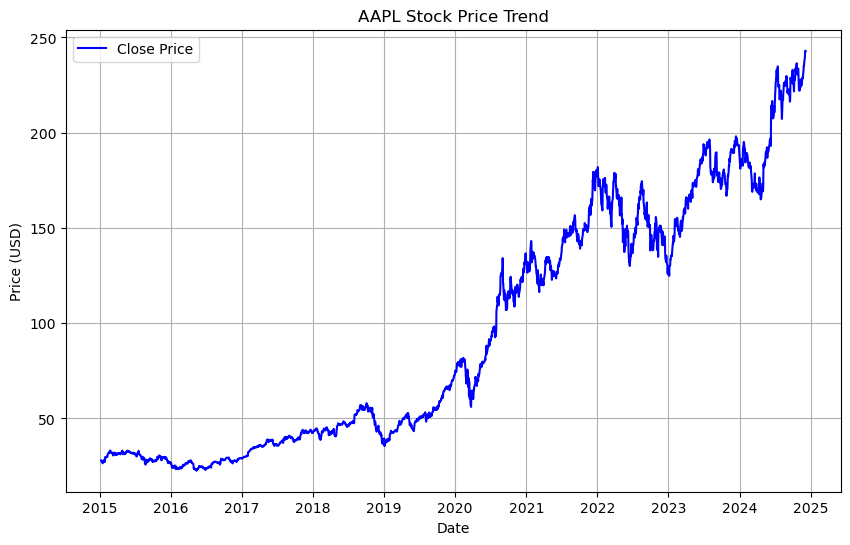

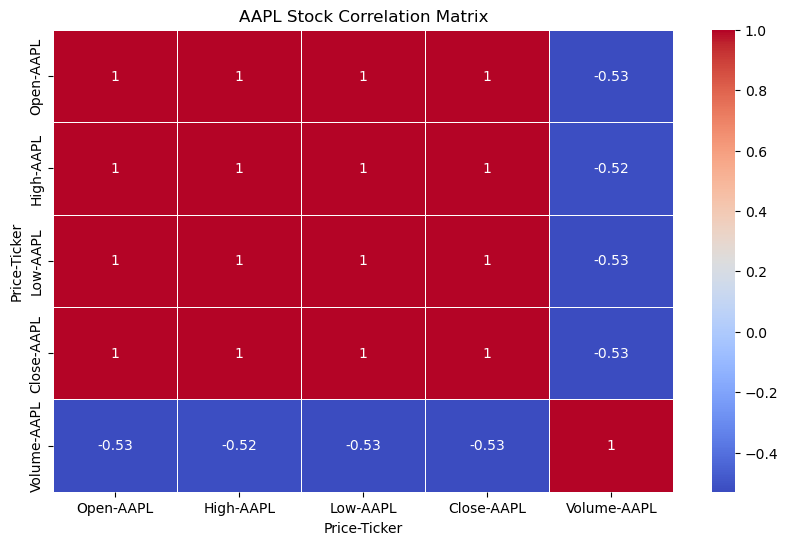

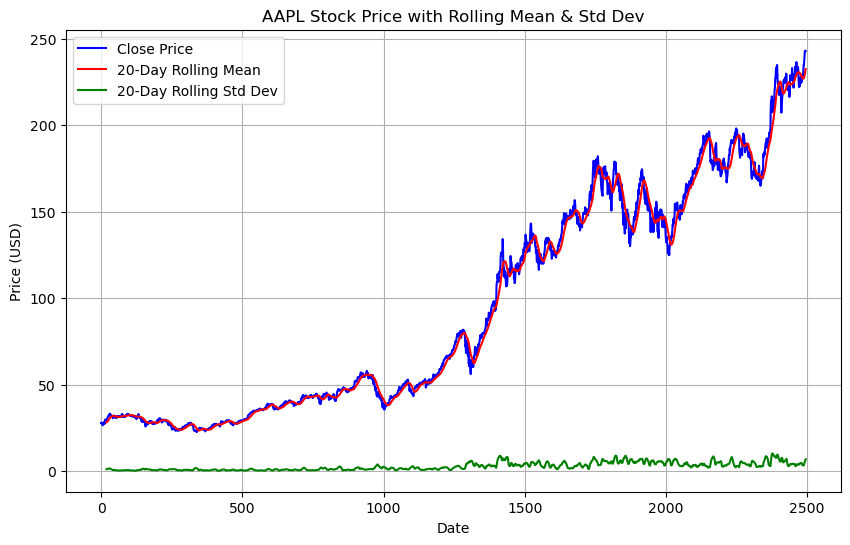

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass 

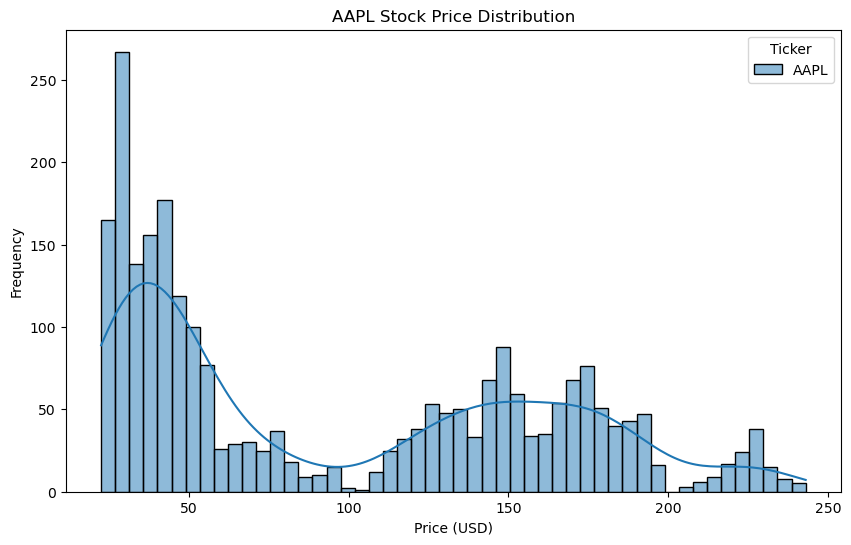

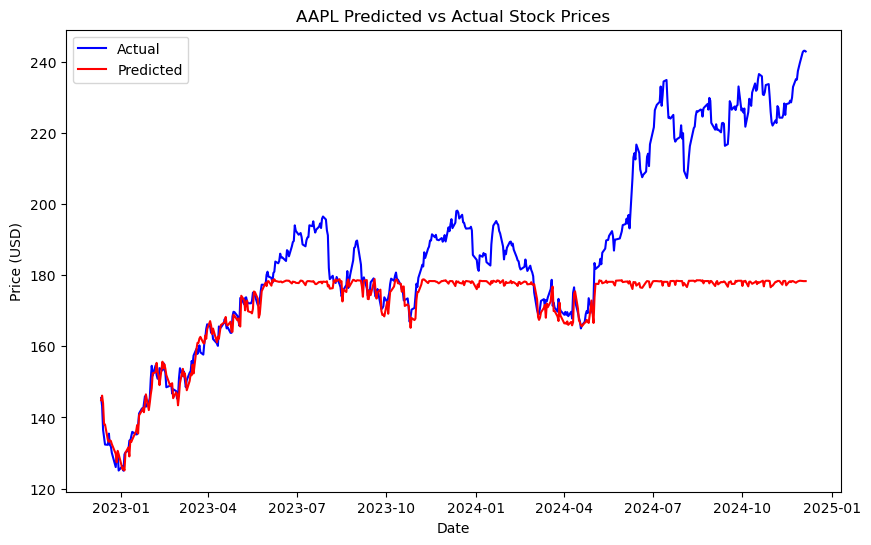

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:193: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:194: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:195: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:196: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:197: FutureWarning:

Calling int on

--- Stock Summary for AAPL ---
Date Range: 2014-12-10 to 2024-12-07
Latest Data (as of 1970-01-01):
  Open Price: 242.91 USD
  Close Price: 242.84 USD
  High Price: 244.63 USD
  Low Price: 242.08 USD
  Volume: 36,852,100
  Trend: Stock is decreasing.
  Sentiment: Positive (Score: 0.07)

GOOG Model Comparison: {'LinearRegression': {'MSE': 6.2657838413308875, 'MAE': 1.8102417900966676, 'R²': 0.9917591321458424, 'Accuracy (%)': 99.17591321458424}, 'RandomForest': {'MSE': 200.6388664707038, 'MAE': 8.924539641416622, 'R²': 0.7361162742183194, 'Accuracy (%)': 73.61162742183194}}


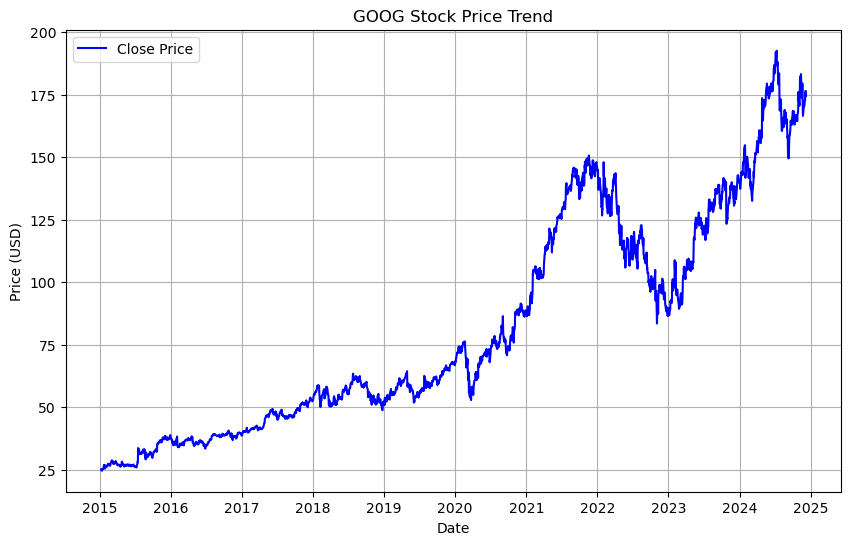

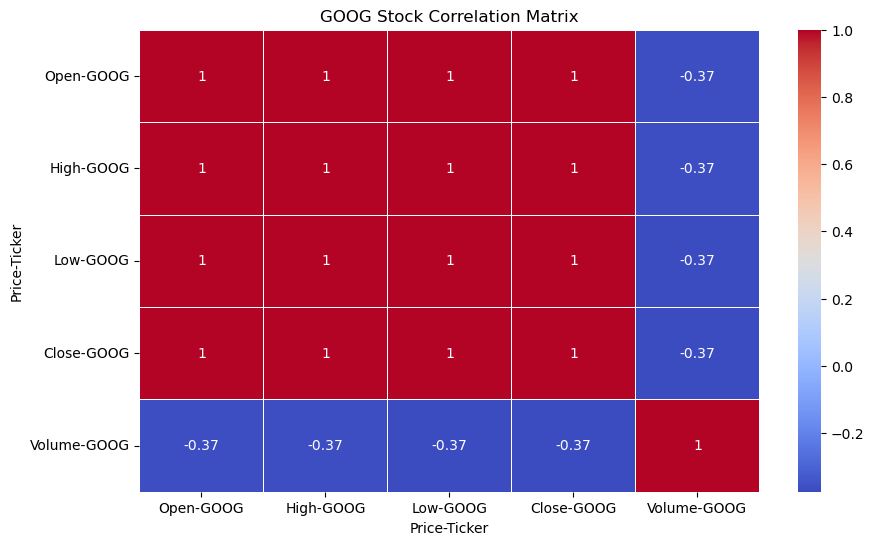

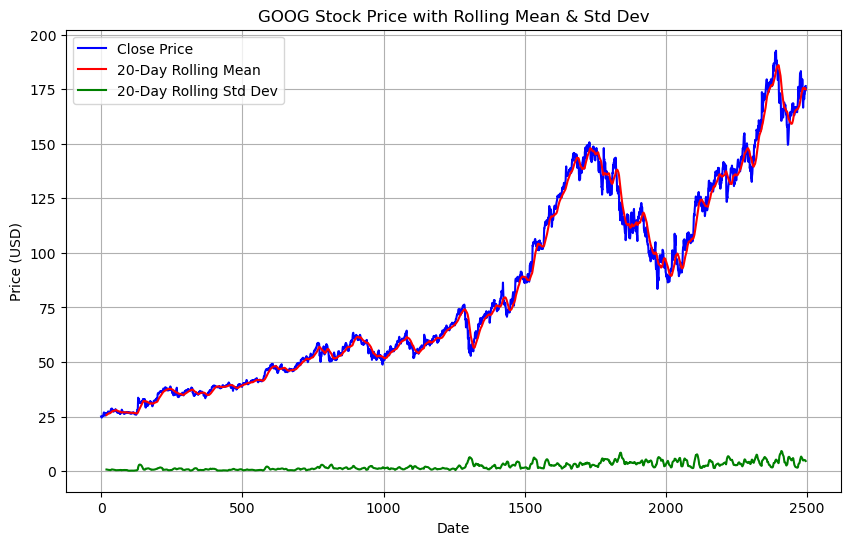

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass 

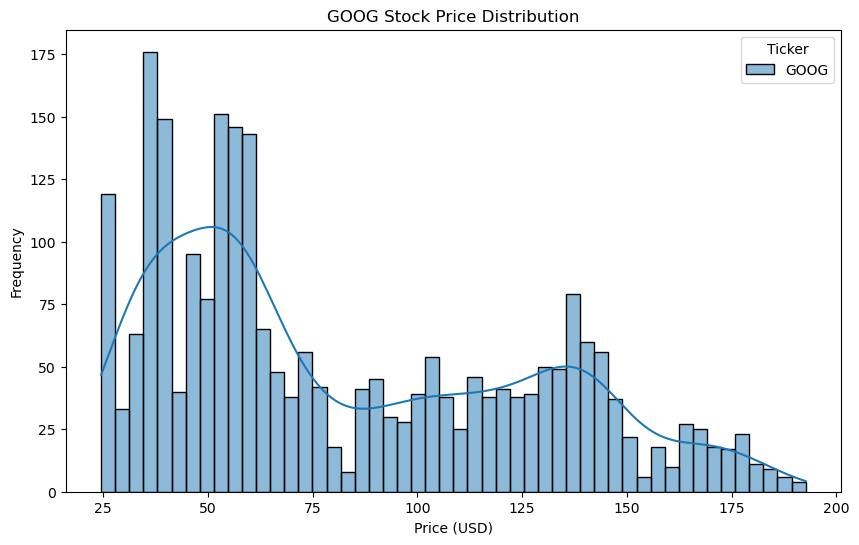

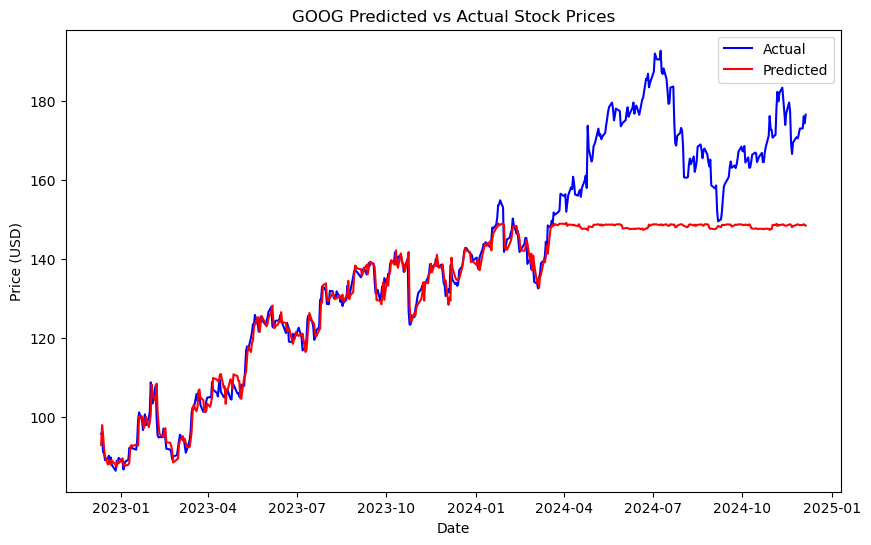

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:193: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:194: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:195: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:196: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:197: FutureWarning:

Calling int on

--- Stock Summary for GOOG ---
Date Range: 2014-12-10 to 2024-12-07
Latest Data (as of 1970-01-01):
  Open Price: 173.88 USD
  Close Price: 176.49 USD
  High Price: 176.84 USD
  Low Price: 173.55 USD
  Volume: 13,305,200
  Trend: Stock is increasing.
  Sentiment: Positive (Score: 0.13)

AMZN Model Comparison: {'LinearRegression': {'MSE': 8.14800634966594, 'MAE': 2.1232945510395838, 'R²': 0.9935699364277814, 'Accuracy (%)': 99.35699364277814}, 'RandomForest': {'MSE': 52.01598704899241, 'MAE': 4.20238752070792, 'R²': 0.9589511729442339, 'Accuracy (%)': 95.89511729442339}}


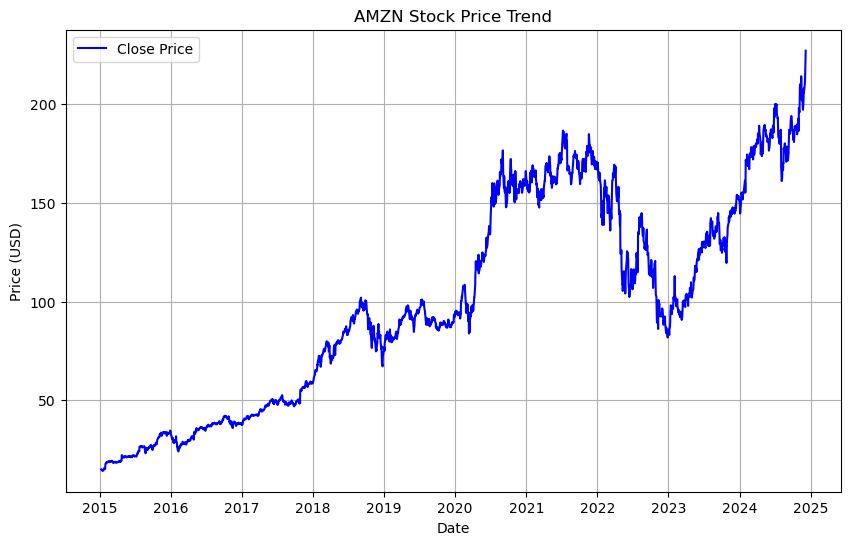

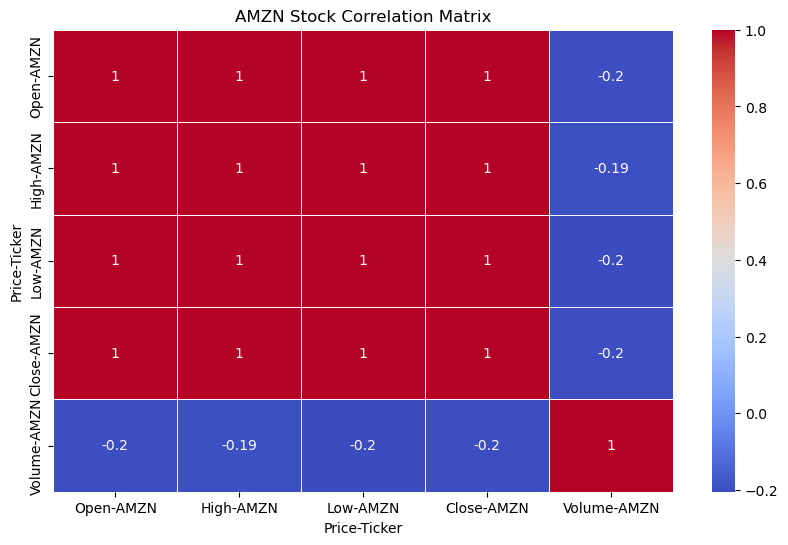

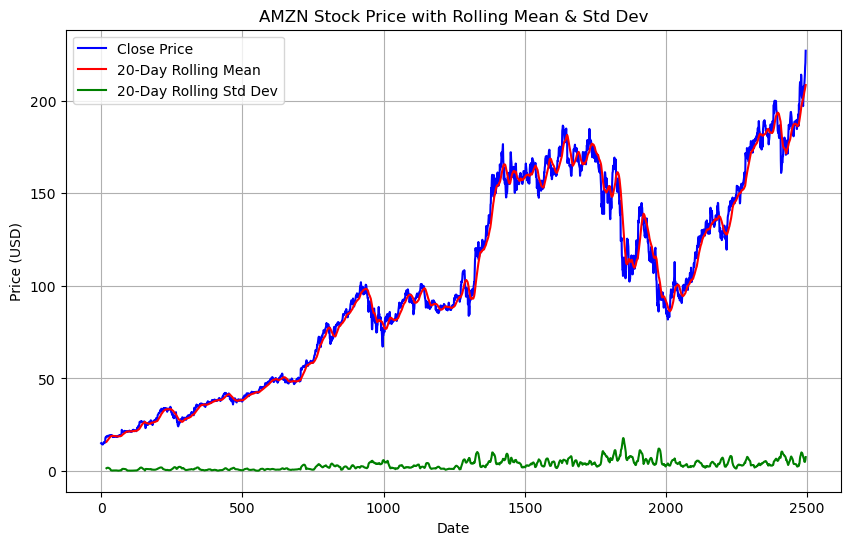

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass 

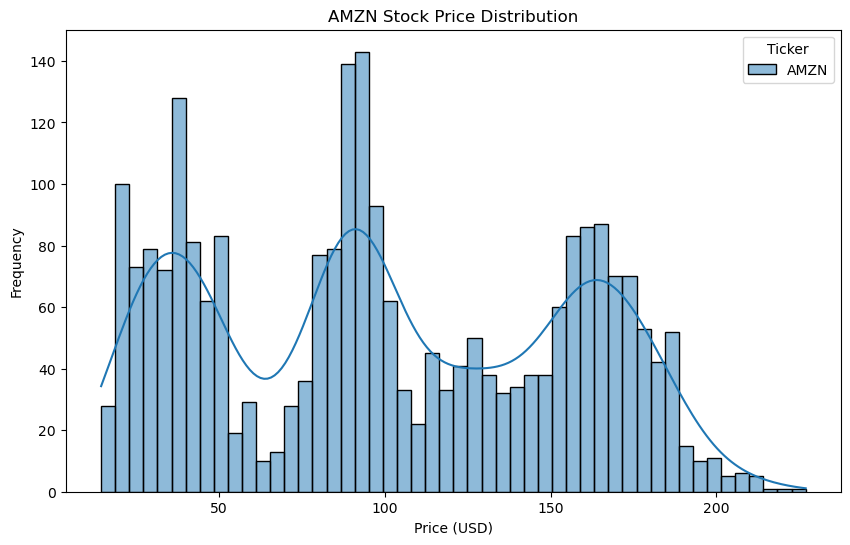

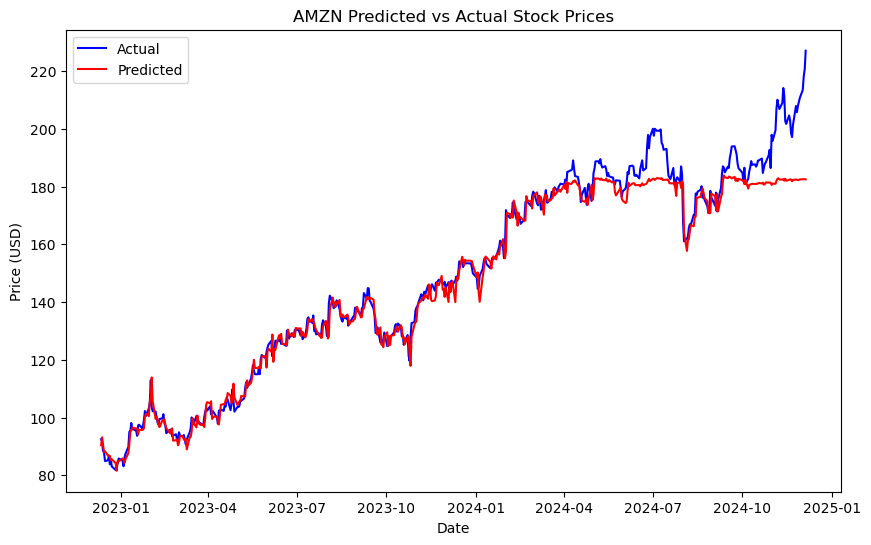

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:193: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:194: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:195: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:196: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:197: FutureWarning:

Calling int on

--- Stock Summary for AMZN ---
Date Range: 2014-12-10 to 2024-12-07
Latest Data (as of 1970-01-01):
  Open Price: 220.75 USD
  Close Price: 227.03 USD
  High Price: 227.15 USD
  Low Price: 220.60 USD
  Volume: 44,123,400
  Trend: Stock is increasing.
  Sentiment: Positive (Score: 0.04)

MSFT Model Comparison: {'LinearRegression': {'MSE': 25.389809480835957, 'MAE': 3.8228933109362386, 'R²': 0.9937149113195315, 'Accuracy (%)': 99.37149113195315}, 'RandomForest': {'MSE': 3587.226584047097, 'MAE': 44.795395141785036, 'R²': 0.11200447507541333, 'Accuracy (%)': 11.200447507541334}}


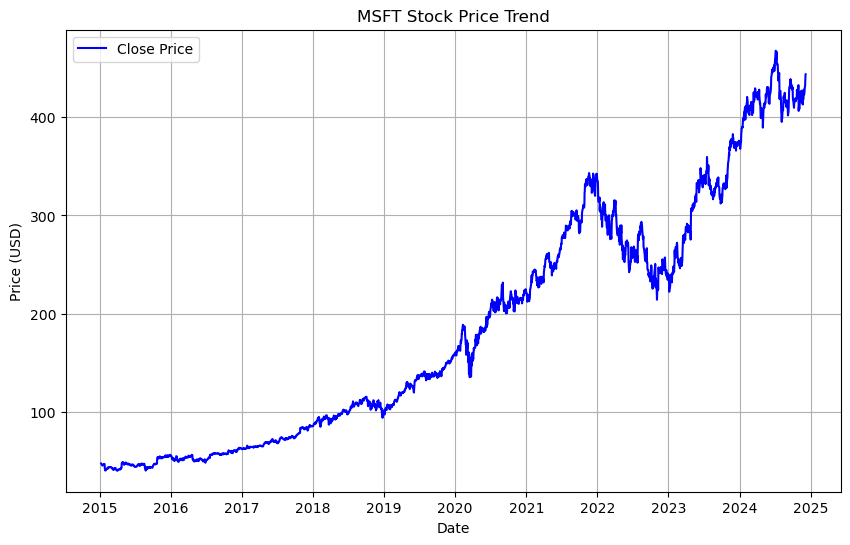

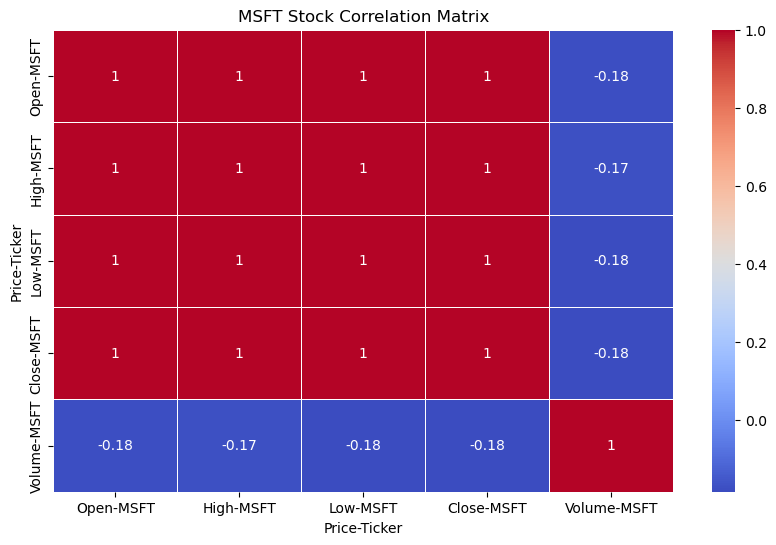

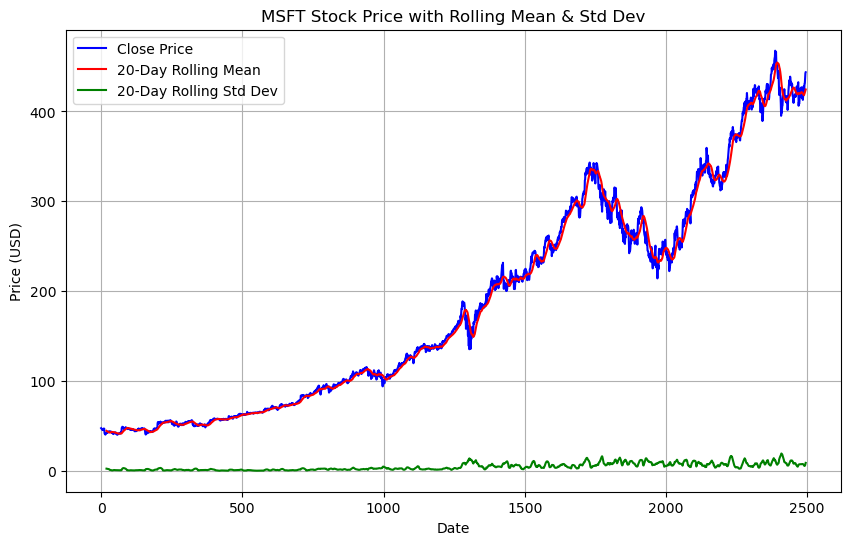

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass 

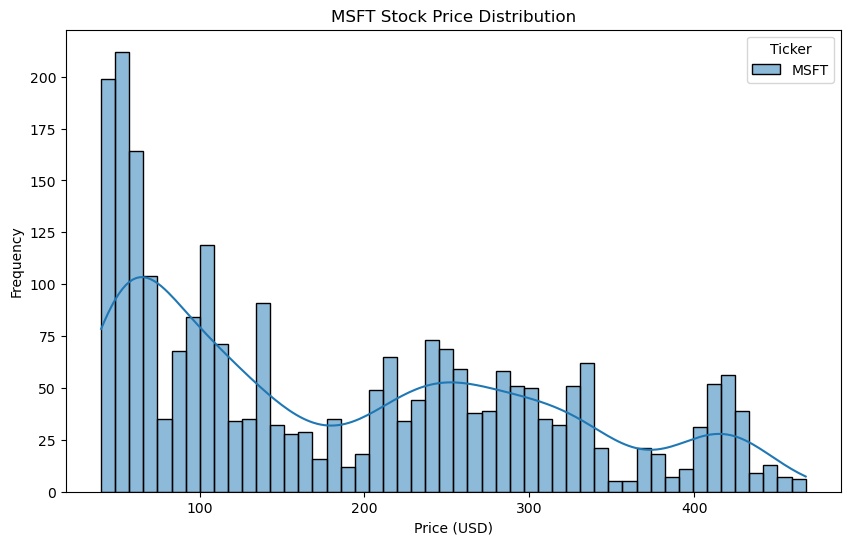

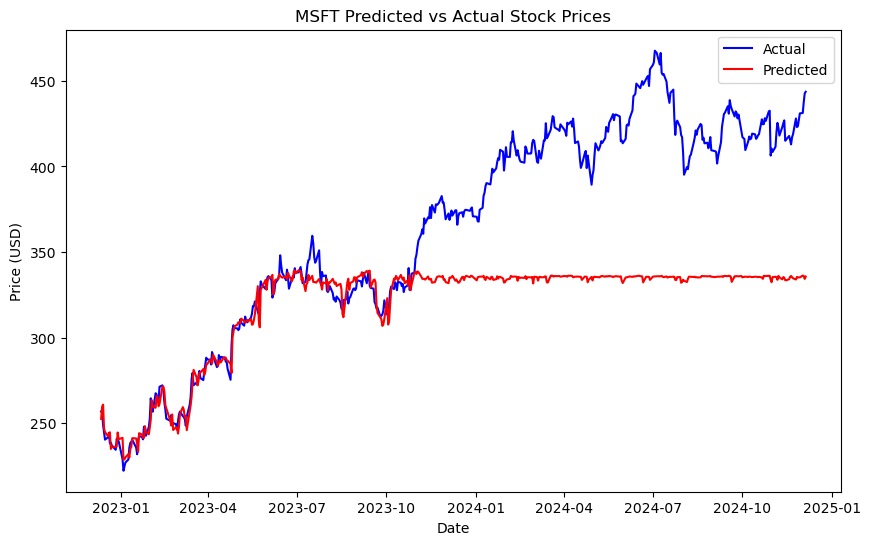

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:193: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:194: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:195: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:196: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:197: FutureWarning:

Calling int on

--- Stock Summary for MSFT ---
Date Range: 2014-12-10 to 2024-12-07
Latest Data (as of 1970-01-01):
  Open Price: 442.30 USD
  Close Price: 443.57 USD
  High Price: 446.10 USD
  Low Price: 441.77 USD
  Volume: 18,814,400
  Trend: Stock is increasing.
  Sentiment: Positive (Score: 0.08)

TSLA Model Comparison: {'LinearRegression': {'MSE': 64.88276888524311, 'MAE': 5.739901205788793, 'R²': 0.9702749823385286, 'Accuracy (%)': 97.02749823385287}, 'RandomForest': {'MSE': 85.3459828194111, 'MAE': 6.814574538634154, 'R²': 0.9609000834854997, 'Accuracy (%)': 96.09000834854997}}


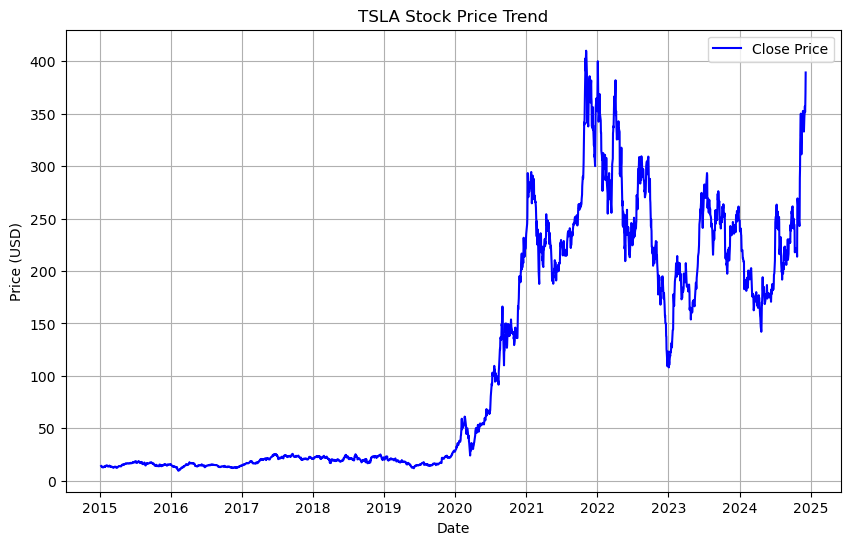

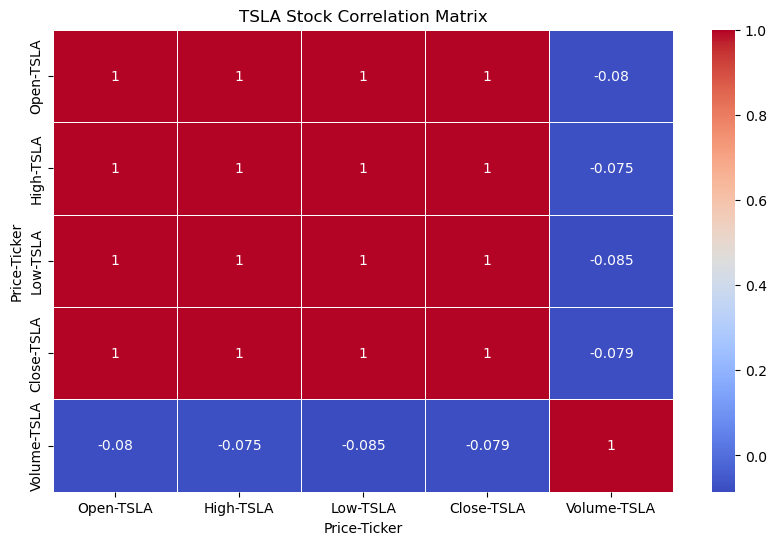

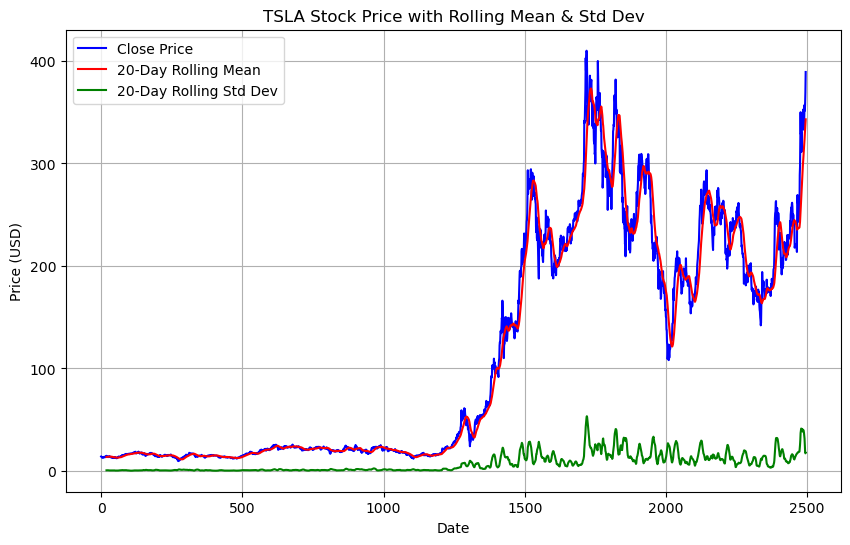

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass 

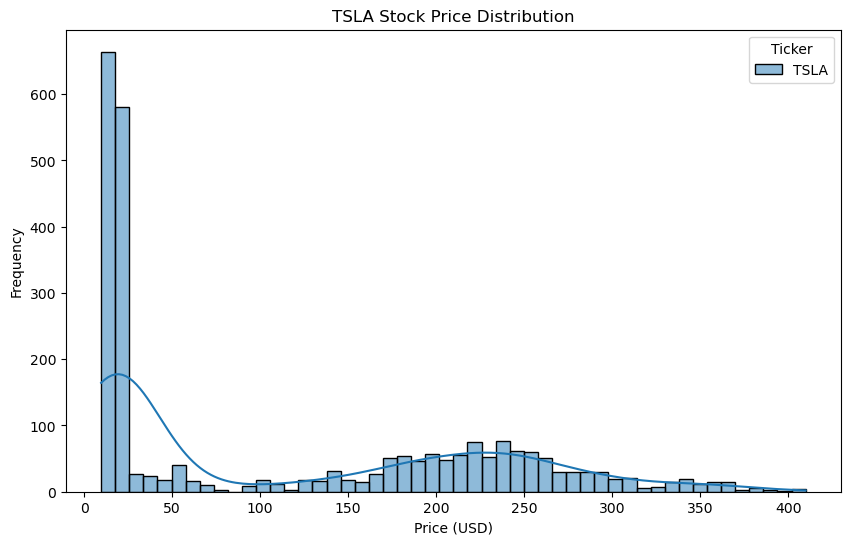

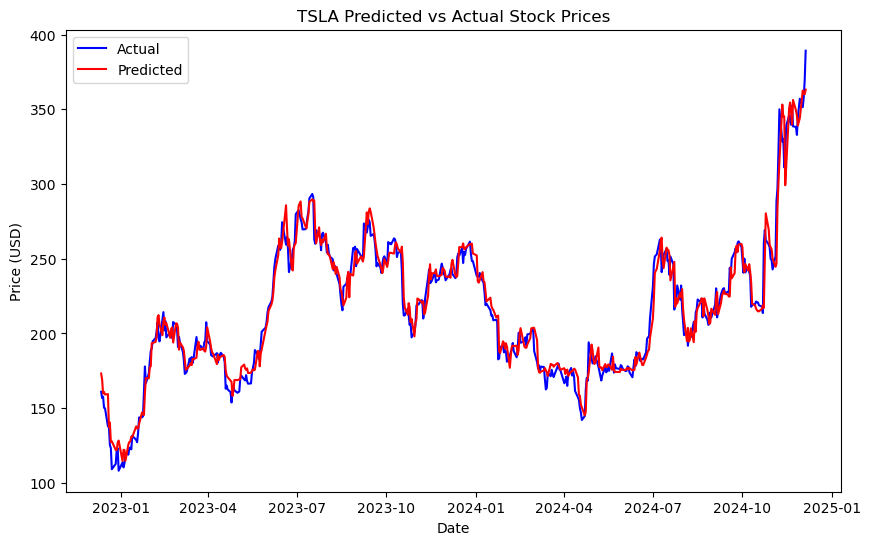

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:193: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:194: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:195: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:196: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:197: FutureWarning:

Calling int on

--- Stock Summary for TSLA ---
Date Range: 2014-12-10 to 2024-12-07
Latest Data (as of 1970-01-01):
  Open Price: 377.42 USD
  Close Price: 389.22 USD
  High Price: 389.49 USD
  Low Price: 370.80 USD
  Volume: 80,548,300
  Trend: Stock is increasing.
  Sentiment: Positive (Score: 0.05)

META Model Comparison: {'LinearRegression': {'MSE': 76.27396329439483, 'MAE': 5.715686409718804, 'R²': 0.9960796361900037, 'Accuracy (%)': 99.60796361900037}, 'RandomForest': {'MSE': 9421.692696307231, 'MAE': 63.83685472767435, 'R²': 0.5157395593441826, 'Accuracy (%)': 51.57395593441826}}


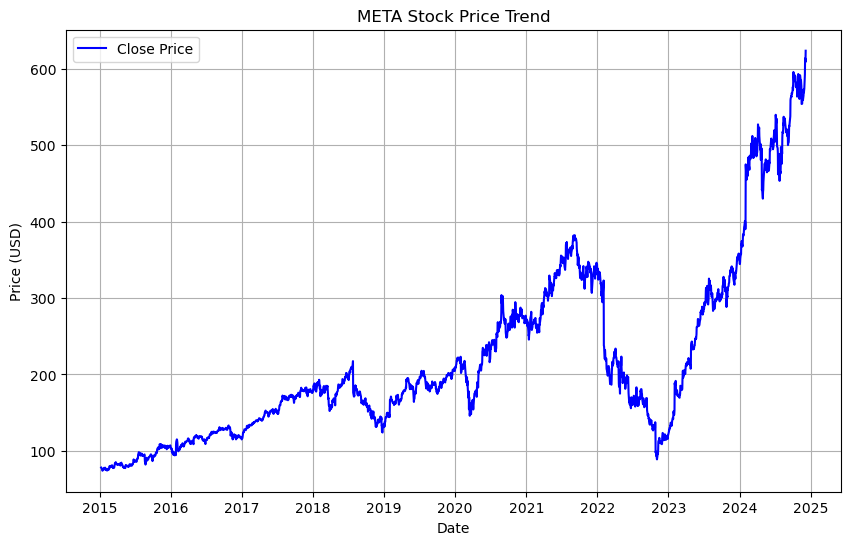

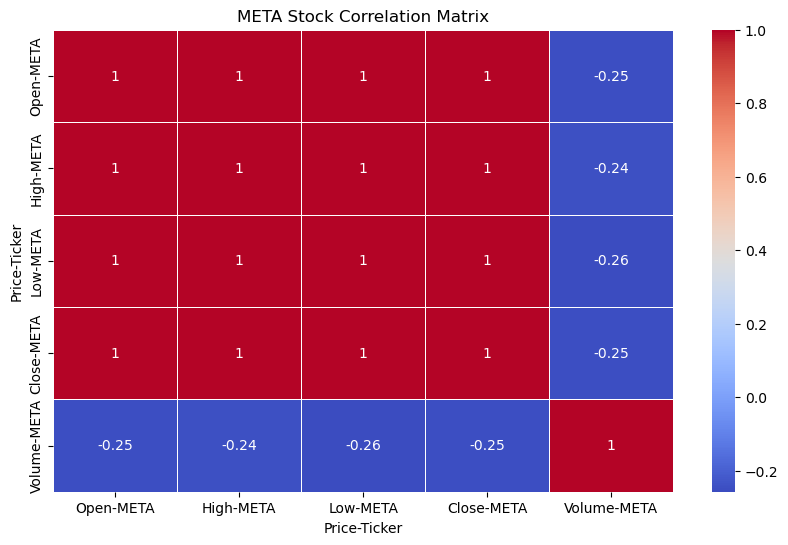

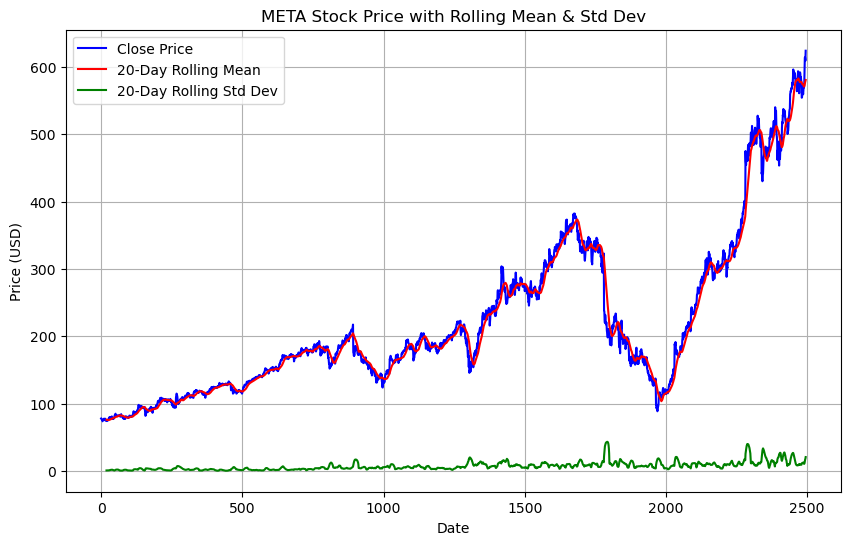

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass 

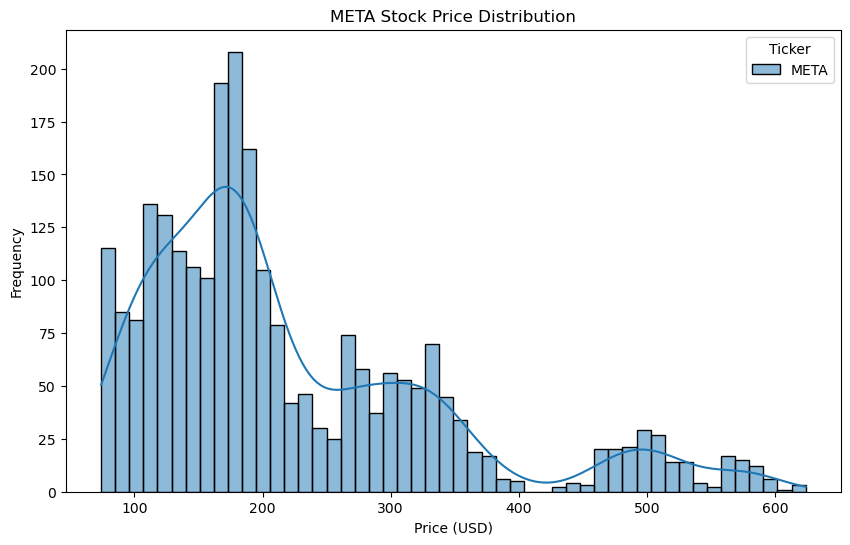

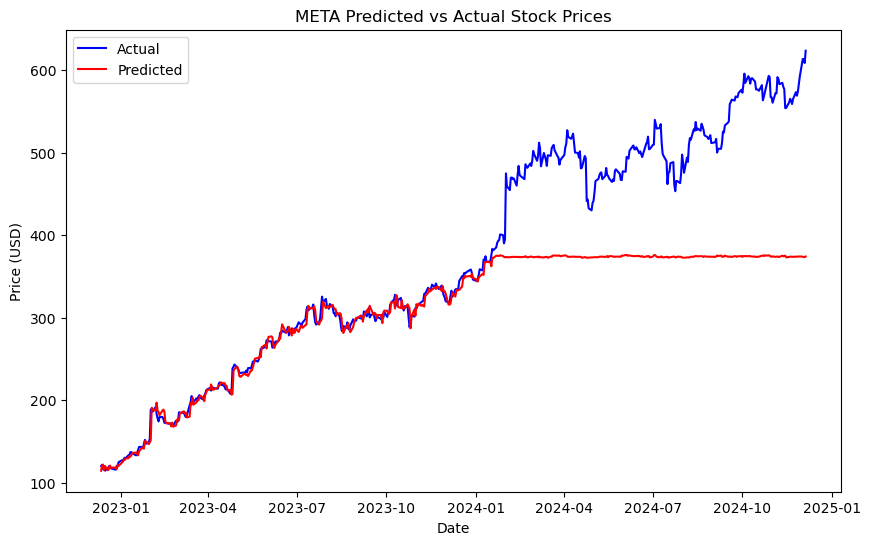

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:193: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:194: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:195: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:196: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:197: FutureWarning:

Calling int on

--- Stock Summary for META ---
Date Range: 2014-12-10 to 2024-12-07
Latest Data (as of 1970-01-01):
  Open Price: 610.10 USD
  Close Price: 623.77 USD
  High Price: 629.79 USD
  Low Price: 608.53 USD
  Volume: 16,924,300
  Trend: Stock is increasing.
  Sentiment: Positive (Score: 0.09)

NVDA Model Comparison: {'LinearRegression': {'MSE': 6.619611438610874, 'MAE': 1.647315518757535, 'R²': 0.9959693522271553, 'Accuracy (%)': 99.59693522271553}, 'RandomForest': {'MSE': 3015.708119558633, 'MAE': 39.38147031904462, 'R²': -0.8362493521522238, 'Accuracy (%)': 0}}


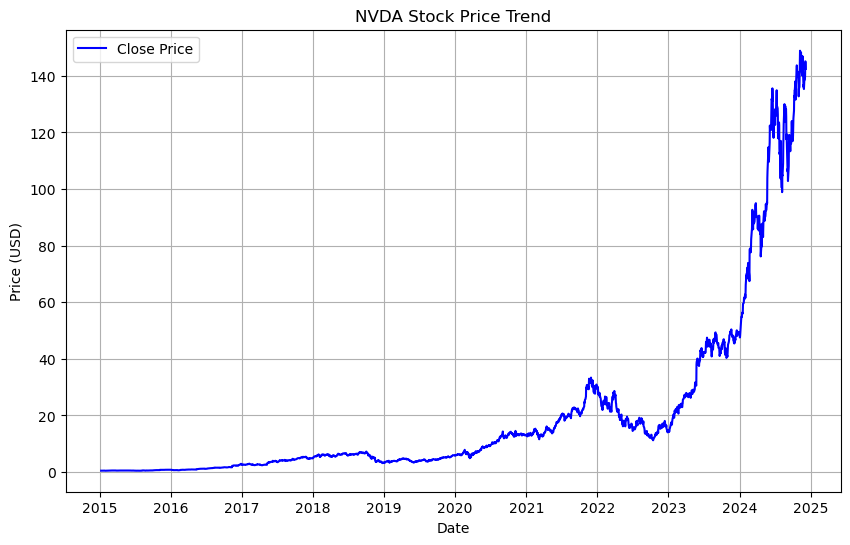

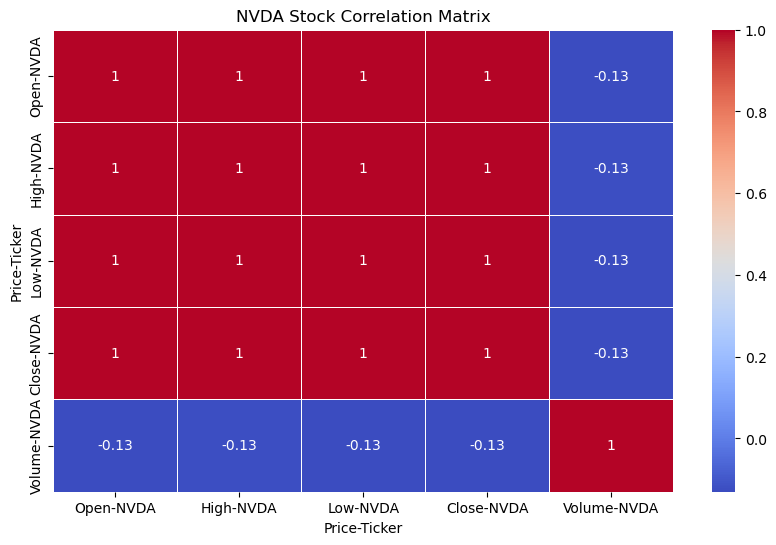

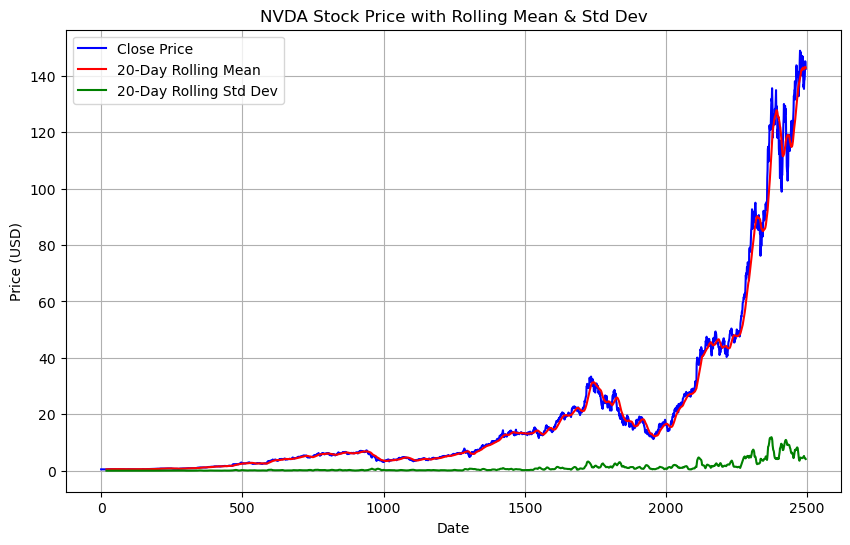

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass 

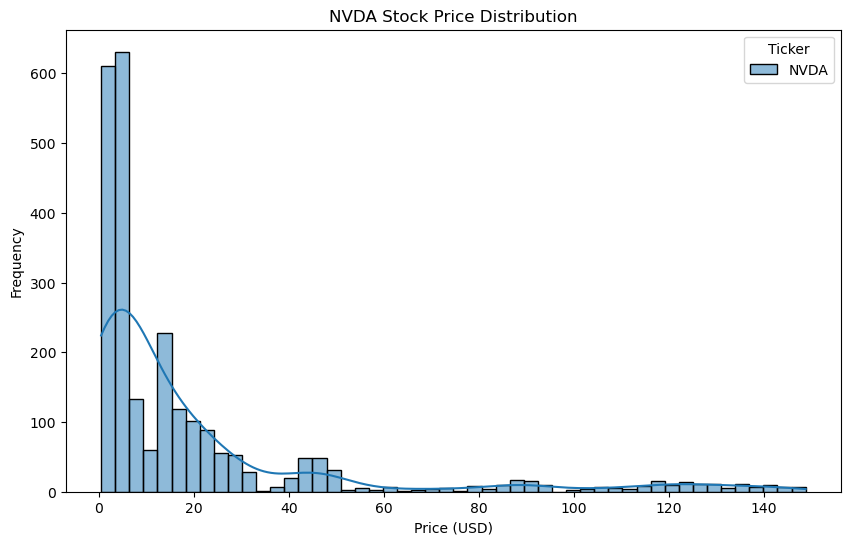

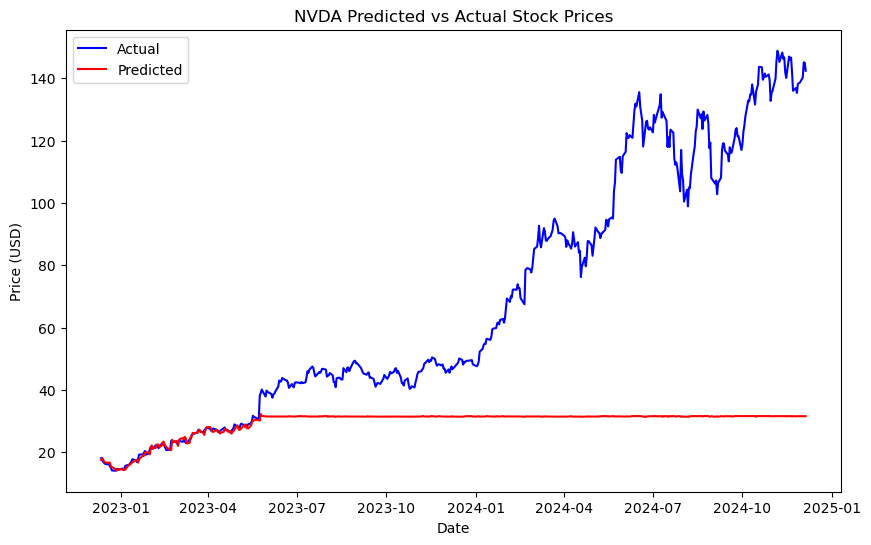

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:193: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:194: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:195: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:196: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:197: FutureWarning:

Calling int on

--- Stock Summary for NVDA ---
Date Range: 2014-12-10 to 2024-12-07
Latest Data (as of 1970-01-01):
  Open Price: 144.60 USD
  Close Price: 142.44 USD
  High Price: 145.70 USD
  Low Price: 141.31 USD
  Volume: 187,969,300
  Trend: Stock is decreasing.
  Sentiment: Positive (Score: 0.12)

BABA Model Comparison: {'LinearRegression': {'MSE': 5.00840977521571, 'MAE': 1.5850882385002887, 'R²': 0.960531003571136, 'Accuracy (%)': 96.05310035711359}, 'RandomForest': {'MSE': 6.160029144276297, 'MAE': 1.8234859703537933, 'R²': 0.9514556158123727, 'Accuracy (%)': 95.14556158123727}}


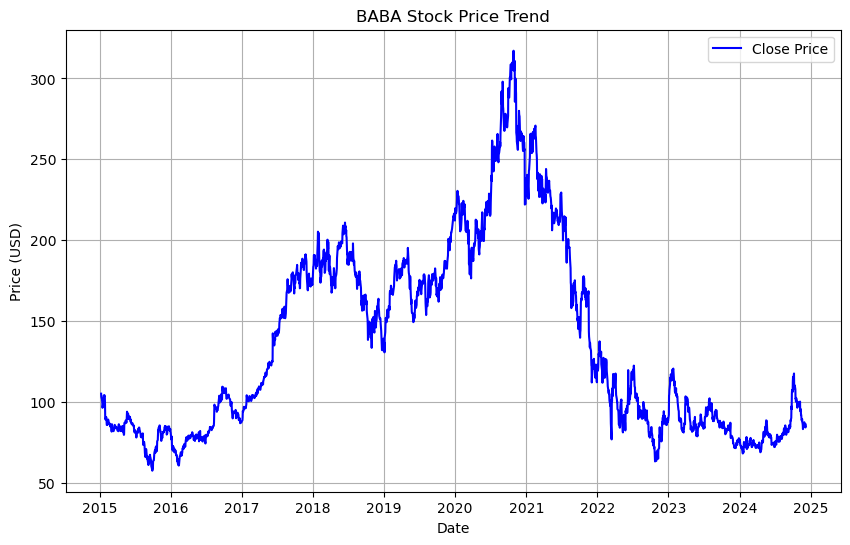

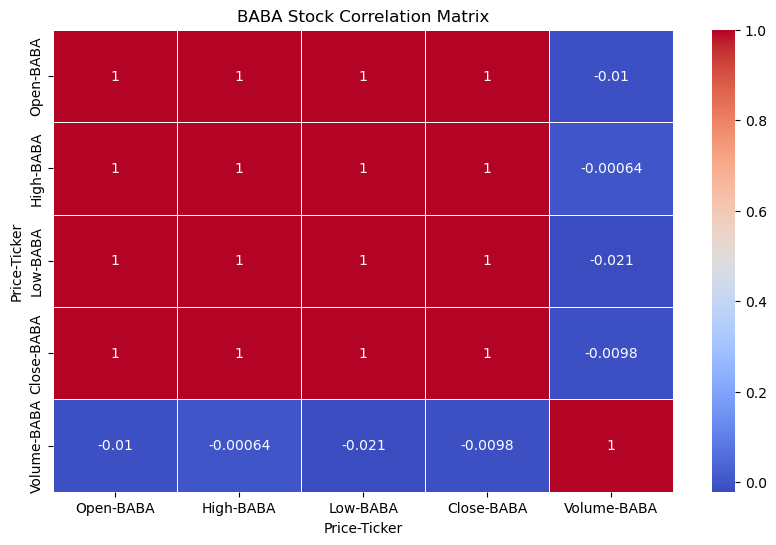

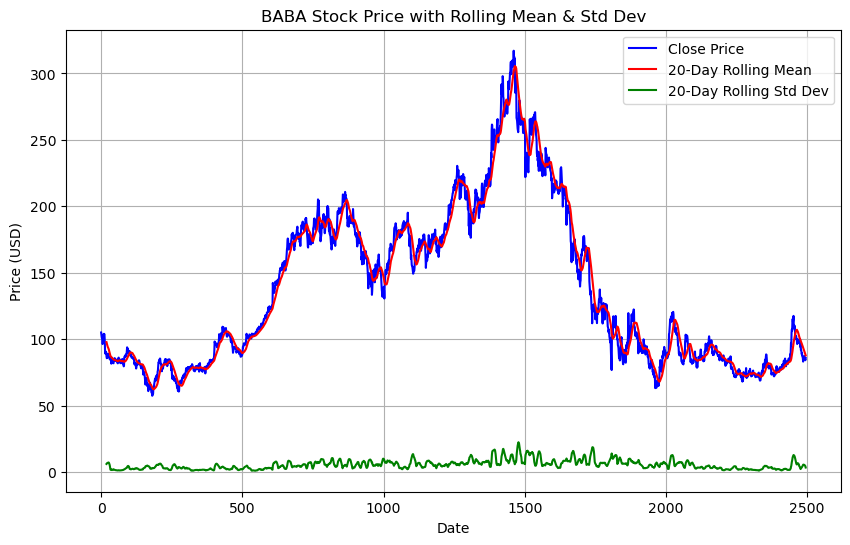

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass 

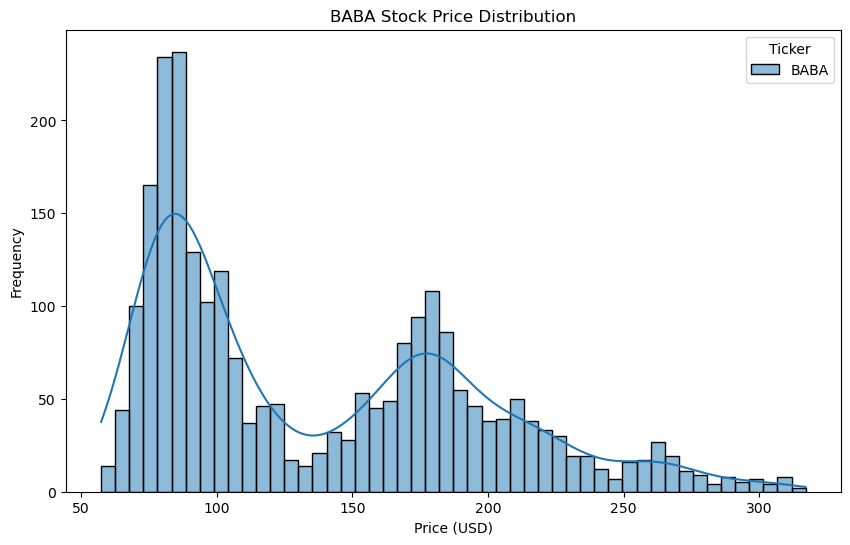

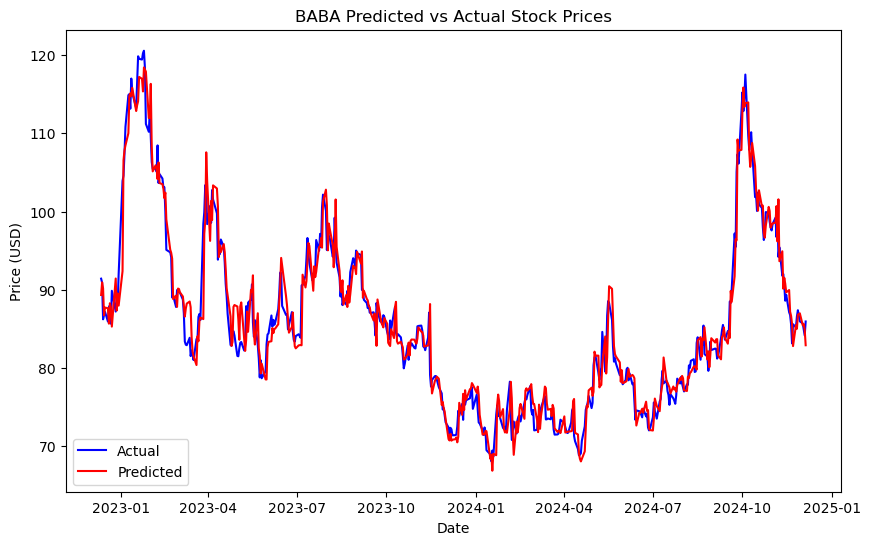

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:193: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:194: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:195: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:196: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:197: FutureWarning:

Calling int on

--- Stock Summary for BABA ---
Date Range: 2014-12-10 to 2024-12-07
Latest Data (as of 1970-01-01):
  Open Price: 86.01 USD
  Close Price: 85.93 USD
  High Price: 86.69 USD
  Low Price: 85.90 USD
  Volume: 11,737,500
  Trend: Stock is decreasing.
  Sentiment: Positive (Score: 0.13)

INTC Model Comparison: {'LinearRegression': {'MSE': 0.8810427384625338, 'MAE': 0.6636128662632941, 'R²': 0.9843084502888776, 'Accuracy (%)': 98.43084502888776}, 'RandomForest': {'MSE': 4.141221487126353, 'MAE': 1.2965290785504726, 'R²': 0.9262440061155162, 'Accuracy (%)': 92.62440061155162}}


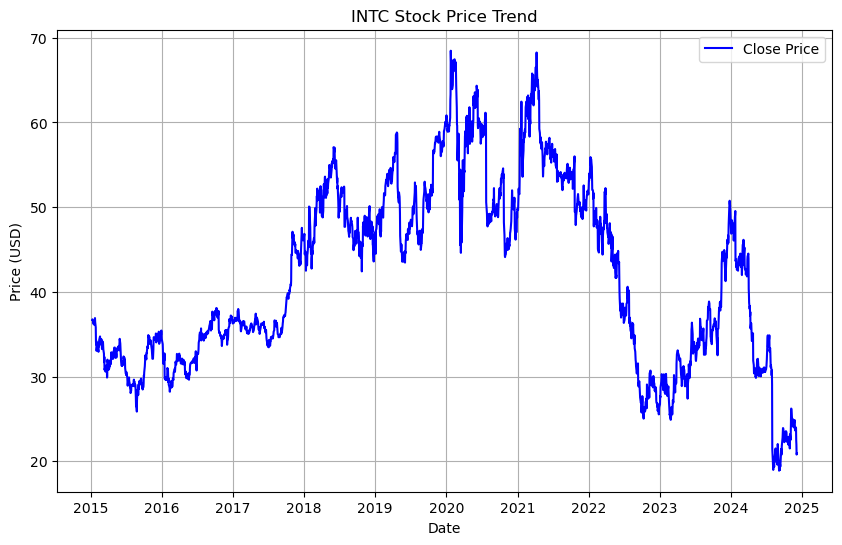

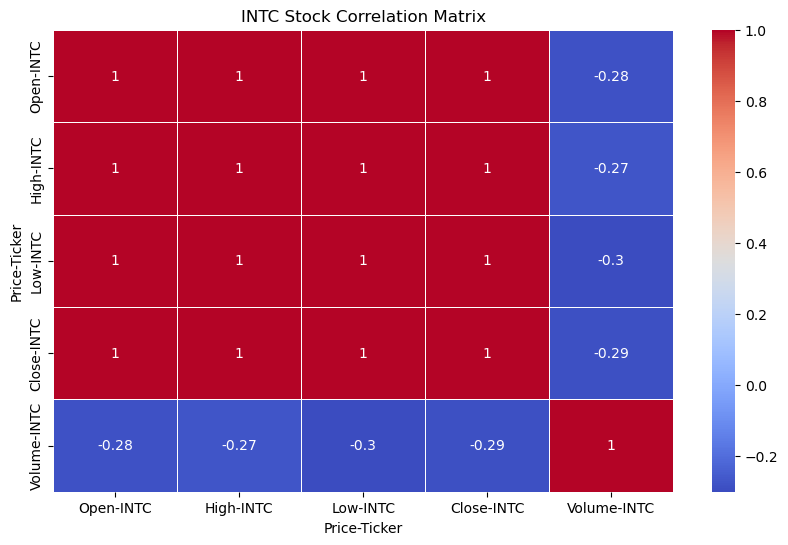

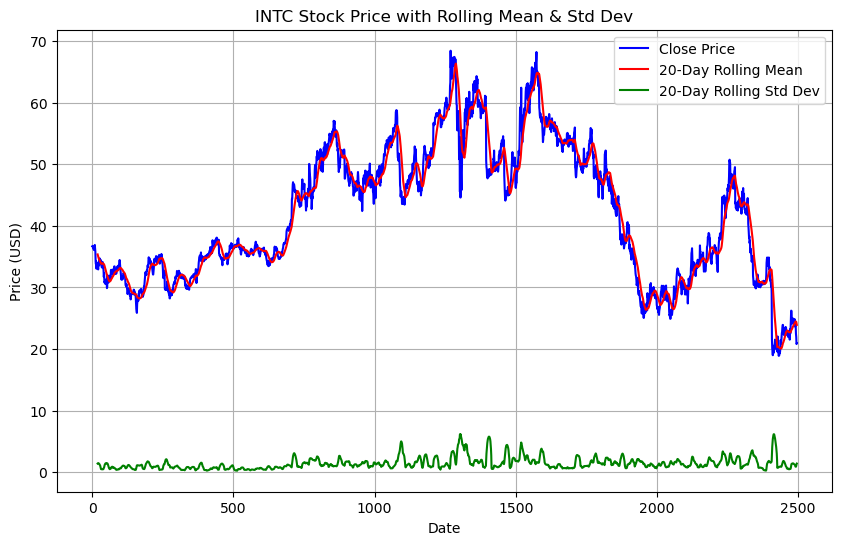

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass 

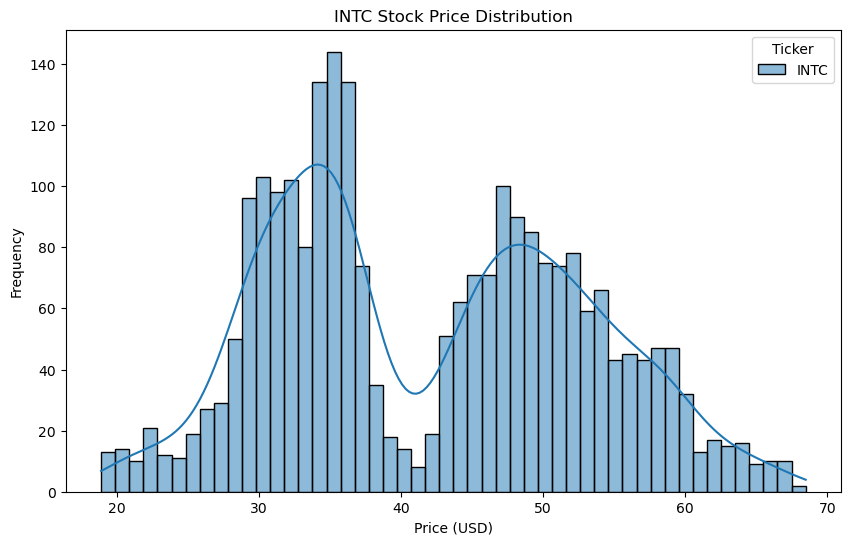

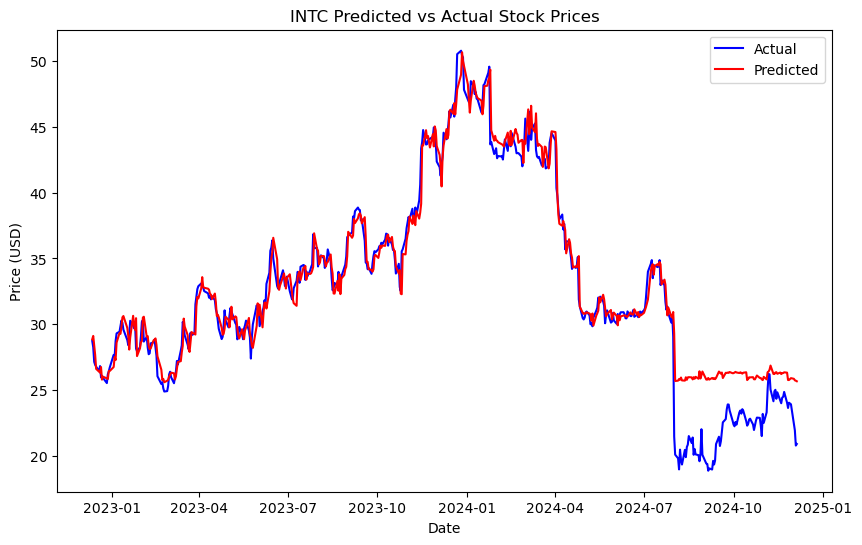

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:193: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:194: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:195: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:196: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:197: FutureWarning:

Calling int on

--- Stock Summary for INTC ---
Date Range: 2014-12-10 to 2024-12-07
Latest Data (as of 1970-01-01):
  Open Price: 20.95 USD
  Close Price: 20.92 USD
  High Price: 21.05 USD
  Low Price: 20.66 USD
  Volume: 78,289,700
  Trend: Stock is decreasing.
  Sentiment: Positive (Score: 0.00)

AMD Model Comparison: {'LinearRegression': {'MSE': 16.24779912246116, 'MAE': 2.851470546770346, 'R²': 0.9862266070316087, 'Accuracy (%)': 98.62266070316088}, 'RandomForest': {'MSE': 149.62024346634212, 'MAE': 7.322721929301719, 'R²': 0.8731656888569315, 'Accuracy (%)': 87.31656888569314}}


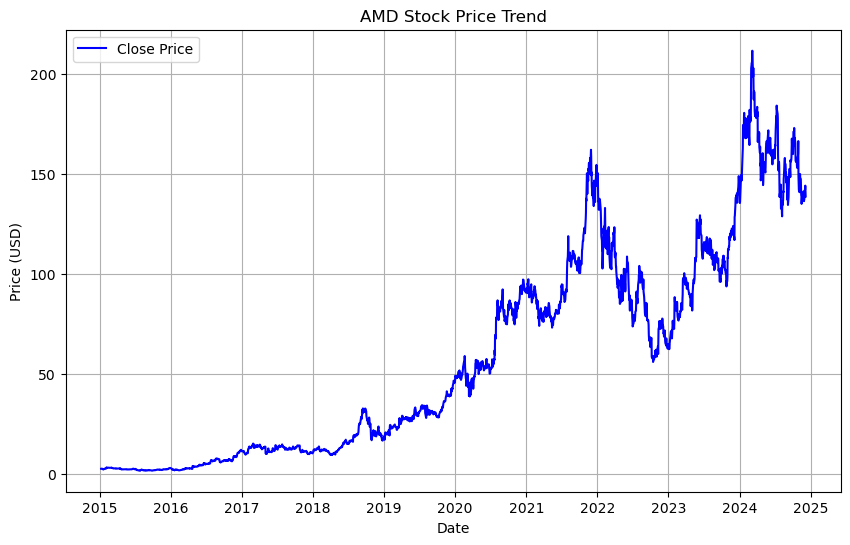

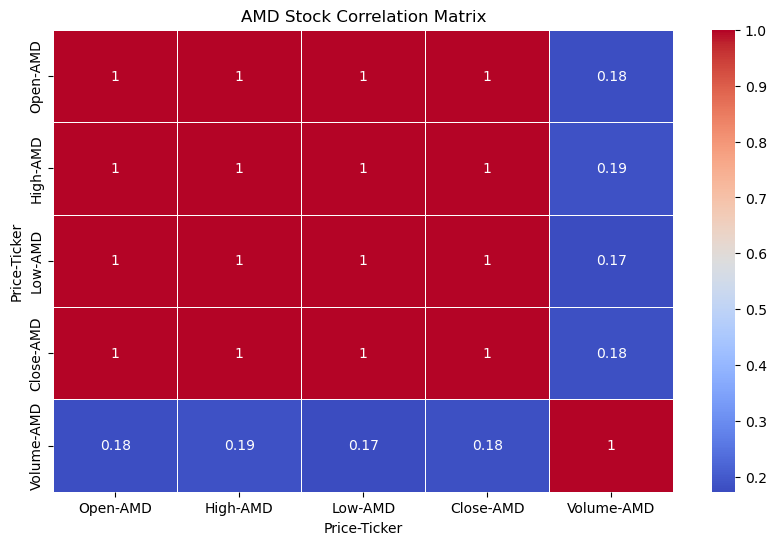

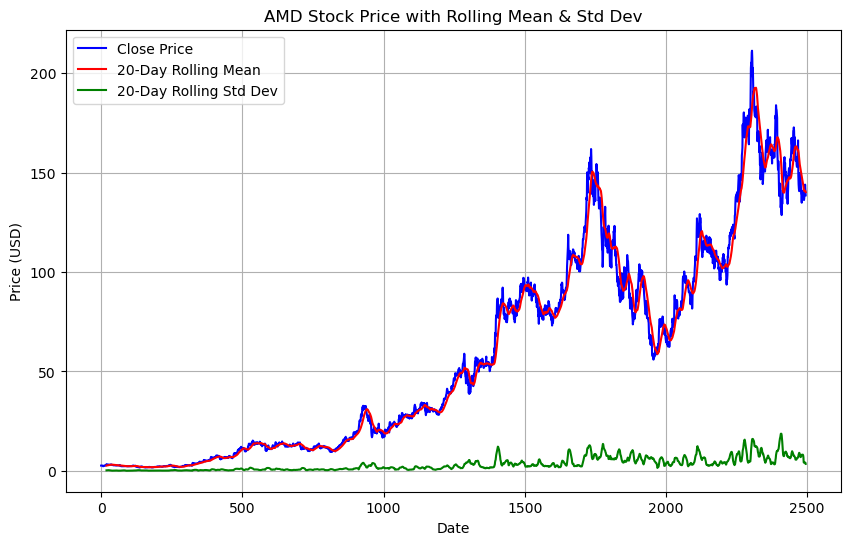

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Bhange Gyanoba\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass 

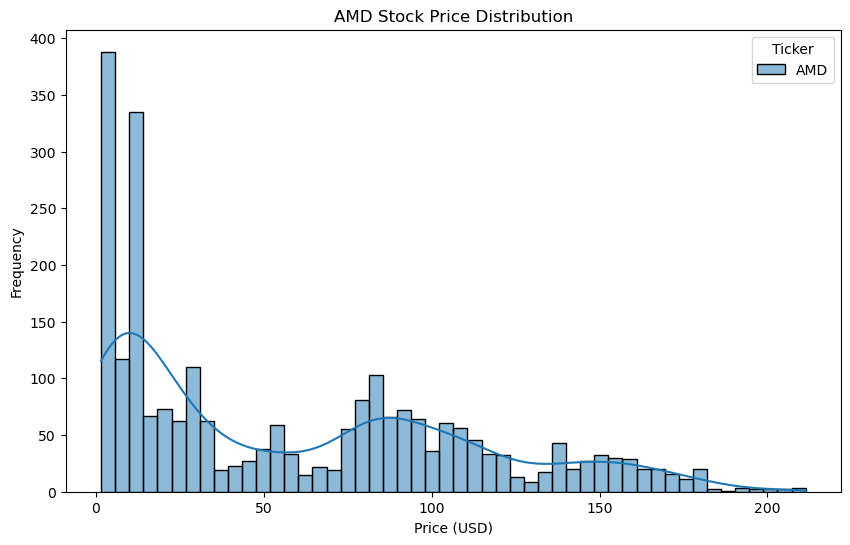

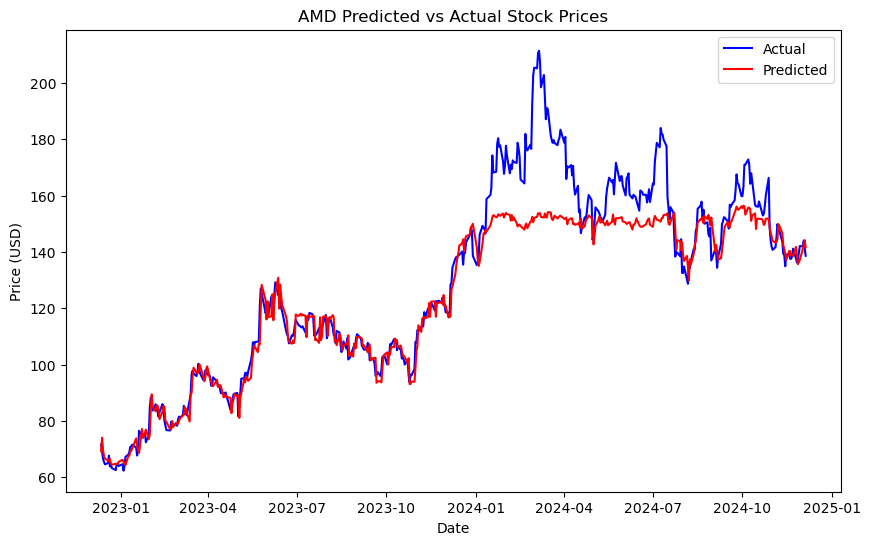

--- Stock Summary for AMD ---
Date Range: 2014-12-10 to 2024-12-07
Latest Data (as of 1970-01-01):
  Open Price: 141.48 USD
  Close Price: 138.59 USD
  High Price: 142.79 USD
  Low Price: 137.40 USD
  Volume: 33,466,900
  Trend: Stock is decreasing.
  Sentiment: Positive (Score: 0.26)



C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:193: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:194: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:195: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:196: FutureWarning:

Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead

C:\Users\Bhange Gyanoba\AppData\Local\Temp\ipykernel_11020\4203532199.py:197: FutureWarning:

Calling int on

In [7]:
# Run the prediction model and visualizations
prediction.run(model_type='RandomForest')